# Analyzing the Discourse on 'Climate Change' in U.S. Media: A Basic Tutorial of How to Do Data Science With Python

Version: 1.0 (8 August 2022)

For a more detailed version, please see the corresponding tutorial on [Medium.com]().

--------

# Introduction

## What is the aim of this tutorial?

In this contribution, I will collect and analyze a small dataset consisting of news articles collected via an API to illustrate the typical pipeline for data-driven research:

**Collecting Data** ➔ **Cleaning/Transforming Data** ➔ **Analyzing/Visualizing Data**

The audience of this tutorial are beginners who just started doing data science with Python. My goal is to illustrate the overall approach mentioned above. Therefore, I will restrict the analysis to a few easy-to-understand methods. Yet, I hope to show that basic methods can lead to promising first results, even when applied on a rather small dataset.

## How are we going to do this?

In this tutorial, I will mainly be using [Jupyter](https://jupyter.org/) notebooks and the programming language [Python](https://www.python.org/).

Jupyter Notebooks are interactive documents that can be displayed in the browser. Among other things, they allow the step-by-step execution of code in code cells as well as a detailled documentation of the code in text cells via [Markdown](https://www.markdownguide.org/). Jupyter notebooks are particularly suitable for data-driven research since they make each of the individual steps of the analysis tansparent while also enabling the presentation of the results in such a way that they can be understood by everyone, including people without any programming knowledge.

The Jupyter notebook of this analysis is available on [GitHub](https://github.com/thomjur/climate_change_in_us_media_tutorial).

# Data

The data we'll be working with consists of English articles from well-known U.S. media websites that mention the term "climate change," which I have collected using [News API's](https://newsapi.org/) *free tier*.

In this case, an API (*application programming interface*) is an interface that enables programs or users to access and retrieve data from an external web server (usually in a JSON format). Regarding our example, querying the News API allows us to retrieve large amounts of article data in a semi-structured form using a simple HTTP query string. For the details of the queries, please see the

A typical article that we collect via the News API looks like this:

```Python
{
    "source": {
        "id": "reuters",
        "name": "Reuters"
    },
    "author": null,
    "title": "Wary shoppers muddy outlook for tech, auto firms in Asia - Reuters",
    "description": "Asian tech firms from chipmaker Samsung to display panel maker [...]",
    "urlToImage": "https://www.reuters.com/resizer/43w65Nb0zXMVr68fW8Al2pM83M8=/1200x628",
    "publishedAt": "2022-07-28T08:02:00Z",
    "content": "July 28 (Reuters) - Asian tech firms from chipmaker Samsung to display … [+5170 chars]"
}

```

As we can see, it includes a lot of information. In this tutorial, we will focus on the title of the retrieved articles. The data basis of our analyis includes articles published between 22 June 2022 and 22 July 2022 from the following news websites:

1. **Fox News**
2. **Breitbart**
3. **The Washington Post**
4. **CNN**

If you want to include other websites as well, you can easily retrieve additional data from other news websites via the News API. The collection of articles from the four websites was grouped into two corpora according to the general political orientation of the websites (right-wing/conservative vs. liberal): Fox News and Breitbart (**Corpus Conservative**, 195 articles) and The Washington Post and CNN (**Corpus Liberal**, 184 articles).

# Research question and methods

In this tutorial, the titles of the retrived article data will be examined. The following methods are used during the analysis and their results are visualized:

1. **Named-Entity Recognition**.
2. **Bag-of-Words**
3. **Sentiment Analysis**

Since the focus of this article lies on the interplay of the individual steps in the pipeline, the analysis methods were restricted to a selection of easy-to-understand and easy-to-implement techniques. For a mor in-depth analysis, please feel free to add additional methods, for example from the field of corpus linguistics or a complementary qualitative analysis in the sense of a *mixed-methods* approach. Also, it might make sense to increase the size and variets of the corpus data.  

# ANALYSIS


In [1]:
from newsapi import NewsApiClient
import pickle

# 1. Collecting and Loading Data (News API)

First, we need to collect, store and load the article data into our notebook.

Before we can do so, we need to import the necessary libraries and define a list with the website IDs to which we want to restrict our search (see the News API documentation). Next, we collect the data from the News API using our auth key and store the collected data in a pickle format on our computer for later use.

In [2]:
# IDs news websites for News API

NEWSPAGES_A = ["fox-news", "breitbart-news"]
NEWSPAGES_B = ["cnn", "the-washington-post"]

## 1.1 Collecting data via the News API

In [3]:
# Initialisation News API wrapper 
#newsapi = NewsApiClient(api_key='YOUR_KEY_GOES_HERE')

In [4]:
# collecting data for Corpus Conservative

for portal in NEWSPAGES_A:
    all_articles = newsapi.get_everything(q='\"climate change\"',
                                          sources=portal,
                                         )
    with open(portal+'.pkl', 'wb') as f:
        pickle.dump(all_articles, f)

NameError: name 'newsapi' is not defined

In [5]:
# ollecting data for Corpus Liberal

for portal in NEWSPAGES_B:
    all_articles = newsapi.get_everything(q='\"climate change\"',
                                          sources=portal,
                                         )
    with open(portal+'.pkl', 'wb') as f:
        pickle.dump(all_articles, f)

NameError: name 'newsapi' is not defined

## 1.2 Loading stored data

Now, we can reload the data of both corpora into our notebook. Why haven’t we done so already in the first step? I suggest collecting the data only once and then keep working with the same dataset for a while. Once you have acquired enough data and stored it, you can simply skip the first step the next time you want to work with your data and start by loading the already collected data into your notebook.

Storing the data is also important to share it with others, thereby making the results of your analysis reproducible and transparent, even at a much later point when the data is maybe no longer accessible via the News API.

In [6]:
# loading Corpus Conservative

titles_corpus_A = list()
for portal in NEWSPAGES_A:
    with open(portal+'.pkl', "rb") as f:
        data = pickle.load(f)
        print(f'Loading data from {portal}.')
        for article in data['articles']:
            titles_corpus_A.append(article['title'])
print(f'\nEs liegen Daten zu {len(titles_corpus_A)} Artikel vor.')

Loading data from fox-news.
Loading data from breitbart-news.

Es liegen Daten zu 195 Artikel vor.


In [7]:
# loading Corpus Liberal

titles_corpus_B = list()
for portal in NEWSPAGES_B:
    with open(portal+'.pkl', "rb") as f:
        data = pickle.load(f)
        print(f'Loading data from {portal}.')
        for article in data['articles']:
            titles_corpus_B.append(article['title'])
print(f'\nEs liegen Daten zu {len(titles_corpus_B)} Artikel vor.')

Loading data from cnn.
Loading data from the-washington-post.

Es liegen Daten zu 184 Artikel vor.


## 1.3 Exploratory Data Analysis (EDA)

First, we check compare the lengths of the titles in each corpus. Instead of using a word tokenizer (NLTK, spaCy, etc.) we will simply parse the words using `.split(" ")` (+ some additional cleaning).

In [8]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_theme(style="whitegrid")

In [9]:
word_list_corpus_A = [[re.sub(r"\.|,|\'|:|\'|!|\?|\‘|\’", "", word) for word in title.split(" ") if word not in ['-', ' ', '—']]  for title in titles_corpus_A]

The list of lists including the (cleaned) words in each sentence looks like this:

In [10]:
word_list_corpus_A[:3]

[['Forget',
  'Manchin',
  'American',
  'voters',
  'are',
  'biggest',
  'most',
  'reliable',
  'killer',
  'of',
  'climate',
  'agenda',
  'Washington',
  'Post',
  'column',
  'Fox',
  'News'],
 ['Americans',
  'Suffer',
  'As',
  'President',
  'Biden',
  'Sounds',
  'Climate',
  'Alarm'],
 ['Maine',
  'season',
  'for',
  'black',
  'flies',
  'lengthens',
  'with',
  'climate',
  'change']]

In [11]:
word_list_corpus_B = [[re.sub(r"\.|,|\'|:|\'|!|\?|\‘|\’", "", word) for word in title.split(" ") if word not in ['-', ' ', '—']]  for title in titles_corpus_B]

In [12]:
word_list_corpus_B[:3]

[['Frozen', 'sand', 'dunes', 'created', 'by', 'climate', 'change'],
 ['In', 'Pictures', 'Wildfires', 'in', 'Europe'],
 ['Europe', 'battles', 'wildfires', 'in', 'intense', 'heat']]

Next, we are going to create a dictionary for each corpus including the following information:

1. **Sentence text**
2. **Average word length of the words in the sentence**
3. **Number of words in the sentence**
4. **Corpus name**

In [13]:
word_stats_corpus_A = {i: {'text': ' '.join(n), 'avg_word_len': np.array([len(word) for word in n]).mean(), 'word_number': len(n)} for i,n in enumerate(word_list_corpus_A)  }

In [14]:
word_stats_corpus_B = {i: {'text': ' '.join(n), 'avg_word_len': np.array([len(word) for word in n]).mean(), 'word_number': len(n)} for i,n in enumerate(word_list_corpus_B)  }

We now create a pandas DataFrame from both dictionaries and visualize the `average word lengths` and `number of words/sentence` for each corpus as boxplots.

In [15]:
df_A = pd.DataFrame.from_dict(word_stats_corpus_A, orient="index")
df_A["corpus"] = 'con'

In [16]:
df_B = pd.DataFrame.from_dict(word_stats_corpus_B, orient="index")
df_B["corpus"] = 'lib'

In [17]:
df_merged = pd.concat([df_A, df_B])
df_merged.reset_index(inplace=True, drop=True)

In [18]:
df_merged.head(5)

,text,avg_word_len,word_number,corpus
0,Forget Manchin American voters are biggest mos...,5.705882,17,con
1,Americans Suffer As President Biden Sounds Cli...,6.125000,8,con
2,Maine season for black flies lengthens with cl...,5.555556,9,con
3,EPA spends millions from Bidens COVID bill on ...,5.800000,15,con
4,New York Times writer accuses investment firm ...,6.000000,11,con


<AxesSubplot:xlabel='corpus', ylabel='avg_word_len'>

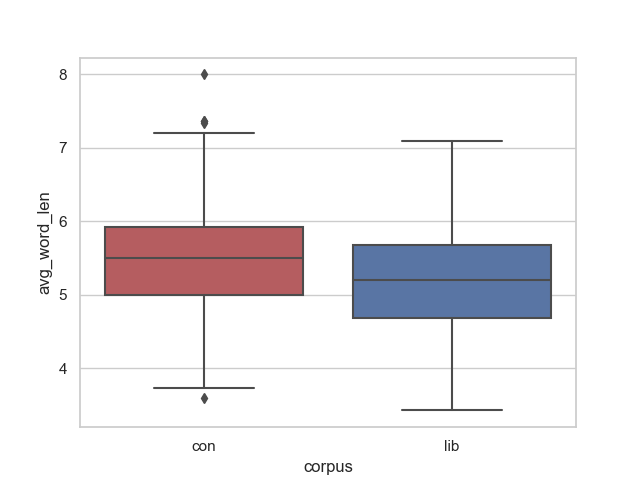

In [19]:
%matplotlib widget

sns.boxplot(x='corpus', y='avg_word_len', palette={'con': 'r', 'lib': 'b'}, data=df_merged)

<AxesSubplot:xlabel='corpus', ylabel='word_number'>

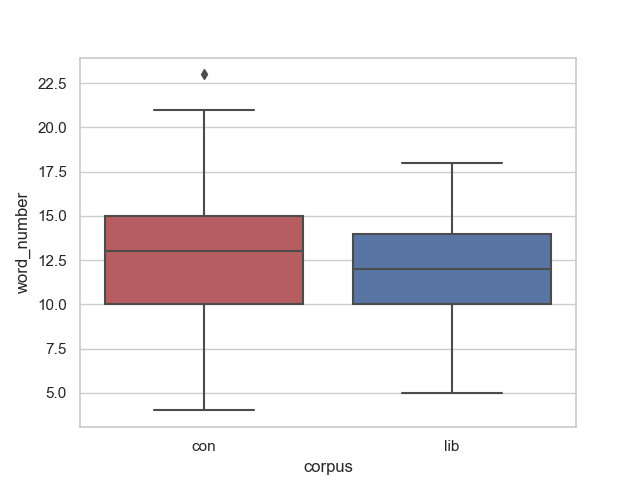

In [20]:
%matplotlib widget

sns.boxplot(x='corpus', y='word_number', palette={'con': 'r', 'lib': 'b'}, data=df_merged)

# 2. Analysis & Visualization

To apply the above-mentioned methods (named-entity recognition,
bag-of-words, sentiment analysis), we will be using various modules and libraries available in Python, such as spaCy, TextBlob, and NLTK (via wordcloud), as well as matplotlib and seaborn for visualizing the results.

After importing the necessary modules, we also initialize two spaCy objects for each corpus. By passing the titles as a string to the nlp instance, spaCy analyzes the titles for us and parses, among others, the named entities in each corpus.

In [26]:
# import necessary libraries

import spacy
from collections import Counter
from wordcloud import WordCloud

#!python -m spacy download en_core_web_sm

In [27]:
nlp = spacy.load("en_core_web_sm")

In [28]:
docs_A = nlp(" ".join(titles_corpus_A))

In [29]:
docs_B = nlp(" ".join(titles_corpus_B))

## 2.1 Named-Entity Recognition (NER)

> Named-entity recognition (NER) (also known as (named) entity identification, entity chunking, and entity extraction) is a subtask of information extraction that seeks to locate and classify named entities mentioned in unstructured text into pre-defined categories such as person names, organizations, locations […] (quoted from the corresponding Wikipedia article)

An analysis of the named-entities mentioned in the article titles can help us to get an impression of the central topics thematized in the articles, such as individual persons, places, institutions or numbers. The named-entity analysis will be conducted using spaCy.

### NER: Corpus Conservative

In [30]:
corpus_A_NER_counter_text = Counter() 
corpus_A_NER_counter_label = Counter()

for ent in docs_A.ents:
    corpus_A_NER_counter_text.update([ent.text])
    corpus_A_NER_counter_label.update([ent.label_])

#### Named-Entities (Individuals)

A brief look at the top 10 most frequently mentioned named-entities in the Corpus Conservative shows that most named-entities are related to U.S. American politics, with a strong focus on Joe Biden and the Democrats. However, none of the top entities are related to actual climate-related topics.

In [31]:
corpus_A_NER_counter_text.most_common(10)

[('Biden', 28),
 ('EPA', 9),
 ('US', 8),
 ('Supreme Court', 8),
 ('Joe Biden', 7),
 ('American', 6),
 ('White House', 6),
 ('Democrats', 5),
 ('Dems', 5),
 ('Congress', 4)]

#### Named-Entities (Classes)

The most frequently used NER classes are heavily dominated by the Person class, closely followed by organizations.

In [32]:
corpus_A_NER_counter_label.most_common(5)

[('PERSON', 111), ('ORG', 96), ('GPE', 37), ('NORP', 34), ('CARDINAL', 14)]

### NER: Corpus Liberal

In [33]:
corpus_B_NER_counter_text = Counter() 
corpus_B_NER_counter_label = Counter()

for ent in docs_B.ents:
    corpus_B_NER_counter_text.update([ent.text])
    corpus_B_NER_counter_label.update([ent.label_])

#### Named-Entities (Individuals)

Interestingly, the entities mentioned in the liberal article corpus hardly differ from those in the conservative corpus. This indicates that both corpora take up and discuss similar (political) events in the context of climate change. Unlike in the Corpus Conservative, however, international topics occur more frequently in the Corpus Liberal (China, Europe) and the Republican Party is also a topic.

In [34]:
corpus_B_NER_counter_text.most_common(10)

[('Biden', 14),
 ('Democrats', 12),
 ('EPA', 8),
 ('Republicans', 6),
 ('Supreme Court', 6),
 ('U.S.', 6),
 ('US', 5),
 ('Europe', 5),
 ('China', 4),
 ('Texas', 4)]

#### Named-Entities (Classes)

Yet, the most frequently appearing NER classes show that the articles in the Corpus Liberal seem less concerned with persons. Instead, they focus on geopolitical entities and other organizations.

In [35]:
corpus_B_NER_counter_label.most_common(5)

[('GPE', 66), ('ORG', 62), ('PERSON', 40), ('DATE', 29), ('NORP', 28)]

### Visualization / Comparison

A visual comparison of the absolute frequencies of the NER categories in the two subcorpora can help us to get a better idea of the differences between the distribution of each class in the two corpora. A comparison of the absolute frequencies makes sense in this case, since the number and length of article-headlines in each corpus are approximately the same.

The visualization of the multi-barplot was done with the library seaborn, which is based on matplotlib.

In a first step, the data is prepared and summarized for visualization using pandas. The next step is to visualize the data using seaborn.

In [36]:
df_con = pd.DataFrame(corpus_A_NER_counter_label.most_common(10), columns=['entity', 'amount'])
df_lib = pd.DataFrame(corpus_B_NER_counter_label.most_common(10), columns=['entity', 'amount'])
df_con['corpus'] = 'conservative'
df_lib['corpus'] = 'liberal'

df = pd.concat([df_con, df_lib])

[Text(0.5, 0, 'Abs. Freq.'), Text(0, 0.5, 'NER Category')]

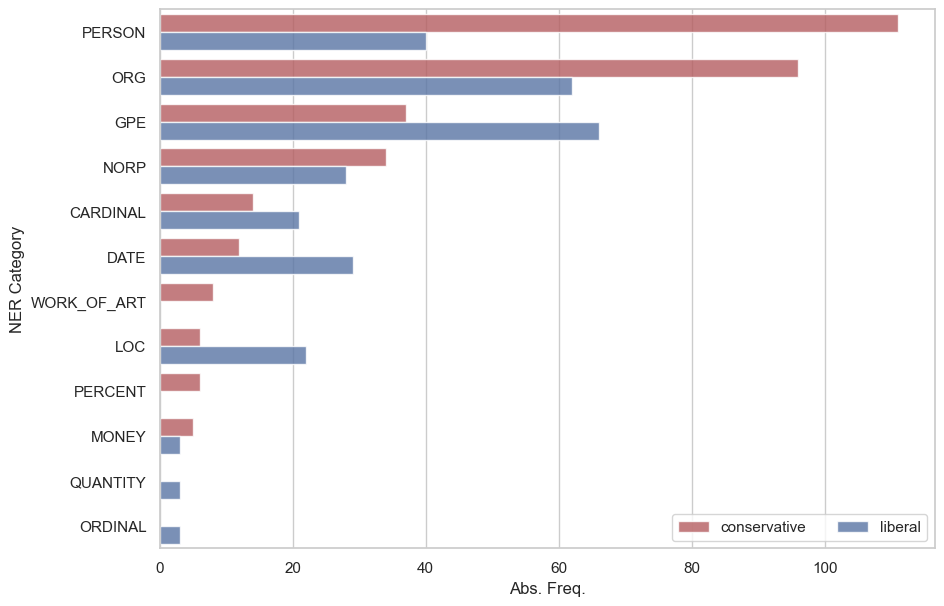

In [44]:
%matplotlib inline

f, ax = plt.subplots(figsize=(10, 7))

sns.barplot(
    data=df,
    x='amount', y='entity', hue="corpus",
    palette={'conservative': 'r', 'liberal': 'b'},
     alpha=.8
)
ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlabel="Abs. Freq.", ylabel='NER Category')

The visualization demonstrates that, compared to the Corpus Liberal, the articles in the Corpus Conservative have a significantly stronger focus on persons (mostly Joe Biden) and organizations, such as the EPA (“Environmental Protection Agency”). The Corpus Liberal articles, on the other hand, mention more numbers, data, and geopolitical associations in their titles. This allows us to set up the working hypothesis that the articles in the Corpus Conservative are primarily concerned with (person-related) U.S. domestic politics, while the Corpus Liberal also discusses the topic of climate change from a more international perspective.

## 2.2 Bag of Words (BoW)

In [38]:
corpus_A_BoW = Counter() 
corpus_B_BoW = Counter()

In this part of the analysis, the frequency of words in the titles of the respective corpora will be counted (so-called bag-of-words [BoW] approach). Their distribution will be visualized with the help of word clouds. Using a bag-of-words analysis means that we simply count the appearance of each word in the respective corpus. For example, consider the following sentences:

`I like bananas. I also like apples.`

The bag-of-words (in the form of a Python dictionary) of these two sentences would look like this:

`{"I": 2, "like": 2, "also": 1, "bananas": 1, "apples": 1}`

We could simply apply the already used Counter() class to count the terms in each string (which we would then, first, have to split into a list of words). However, since we also want to visualize the results as word clouds, we will make use of the `WordCloud()` class in the wordcloud module that already does this job for use (including a basic stemming and other processing steps).

### Word Cloud and BoW  Corpus Conservative

Albeit its simplicity, such an approach can already provide first indications of relevant topics discussed in the context of climate change in the respective corpus. In a further step, it would be interesting to investigate the concrete semantic neighbors of “climate” or “climate change” with the help of a collocation analysis, which, however, won’t be part of this tutorial.

The word cloud of the words in the Corpus Conservative looks like this:

(-0.5, 799.5, 399.5, -0.5)

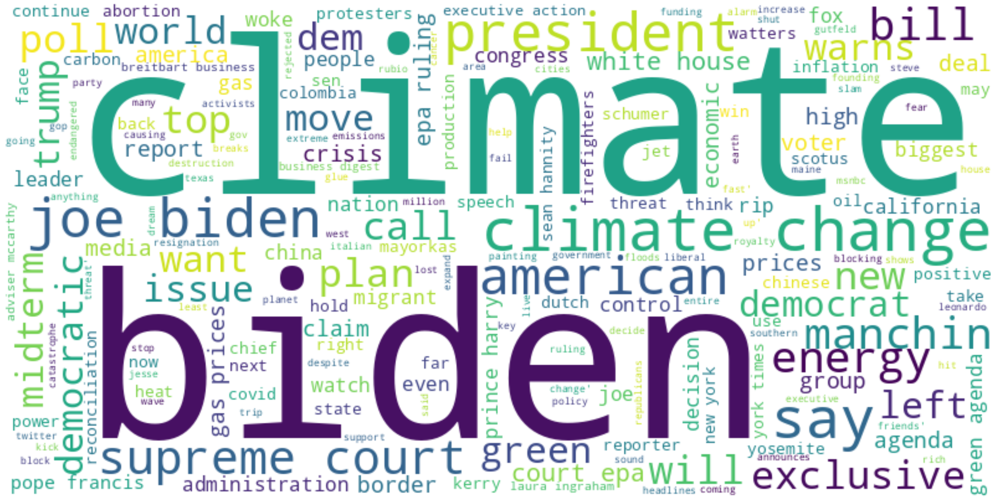

In [45]:
%matplotlib inline

wc = WordCloud(width=800, height=400, background_color="white", min_word_length=3).generate(docs_A.text.lower())
plt.figure(figsize=(40,80))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

As can easily be seen in this visualization, the high frequency of words such as “Biden,” “American,” “supreme court,” “Manchin,” “white house,” “bill,” “poll,” “midterm,” “energy,” “gas prices,” etc., in the Corpus Conservative underlines the already-mentioned importance of domestic political issues. Surprisingly, there are hardly any terms directly related to the environment or the effects of climate change.

### Word Cloud and BoW Corpus Liberal

The word cloud of the words in the Corpus Liberal looks like this:

(-0.5, 799.5, 399.5, -0.5)

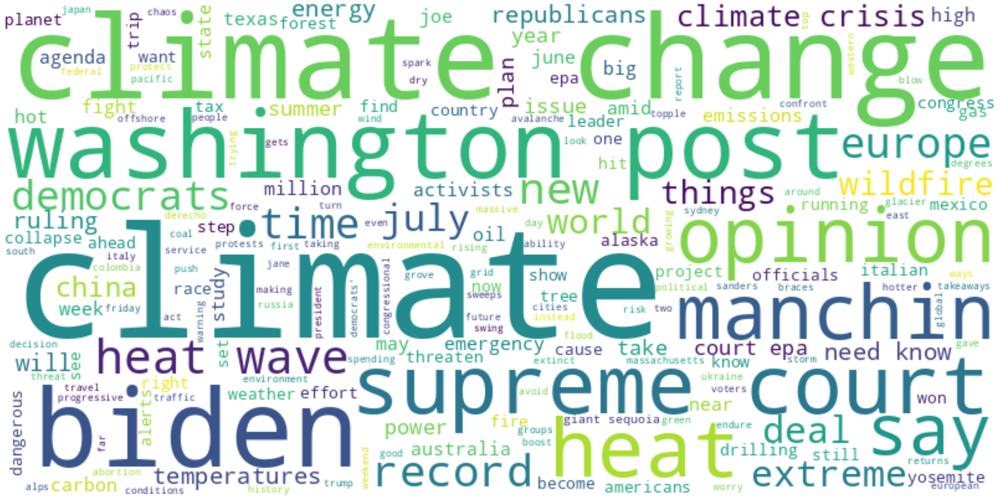

In [43]:
%matplotlib inline

wc = WordCloud(width=800, height=400, background_color="white", min_word_length=3).generate(docs_B.text.lower())
plt.figure(figsize=(40,80))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

Even though some terms that frequently appeared in the Corpus Conservative also play a role in the Corpus Liberal (“Biden,” “supreme court”), the visualization shows that the effects and dangers of climate change are more explicitly mentioned in the Corpus Liberal. This is particularly evident in terms such as “heat,” “heat wave,” “crisis,” “extreme,” “record,” etc.

## 2.3 Sentiment Analysis

In the final part of the analysis, we will use sentiment analyzers available in Python to examine the general emotional orientation (positive/negative) of the titles in both corpora and compare them with each other. This will be done using the textblob library.

In [46]:
from textblob import TextBlob

### Sentiment Analyse: Corpus Conservative

In [47]:
negatives = 0
neg_sentences_A = ""
neg_sentences_A_list = list()

for title in titles_corpus_A:
    polarity = TextBlob(title).sentiment.polarity
    if polarity < 0:
        negatives += 1
        neg_sentences_A += title + " "
        neg_sentences_A_list.append(title)

print(f'{negatives/len(titles_corpus_A)*100:.2f}% der Titel sind negativ.')
        

17.95% der Titel sind negativ.


### Sentiment Analyse: Corpus Liberal

In [48]:
negatives = 0
neg_sentences_B = ""
neg_sentences_B_list = list()

for title in titles_corpus_B:
    polarity = TextBlob(title).sentiment.polarity
    if polarity < 0:
        negatives += 1
        neg_sentences_B += title + " "
        neg_sentences_B_list.append(title)

print(f'{negatives/len(titles_corpus_B)*100:.2f}% der Titel sind negativ.')
        

17.93% der Titel sind negativ.


Applying this code on both corpora shows that 17.95% of the titles in the Corpus Conservative and 17.93% of the titles in the Corpus Liberal are negative, at least according to the sentiment analyzer we applied. Note, however, that we counted every headline with a negative polarity value as negative. Consequently, changing this threshold also leads to different results.

The percentage of negative titles does not tell us a lot. It might be more interesting to see which topics are frequently mentioned in those headlines deemed negative by our sentiment analyzer. We can reuse our previous code for the word clouds at this point, and just pass our list of negative titles instead of the full title list.

### Word Cloud: Negative Sentences Corpus Conservative

(-0.5, 799.5, 399.5, -0.5)

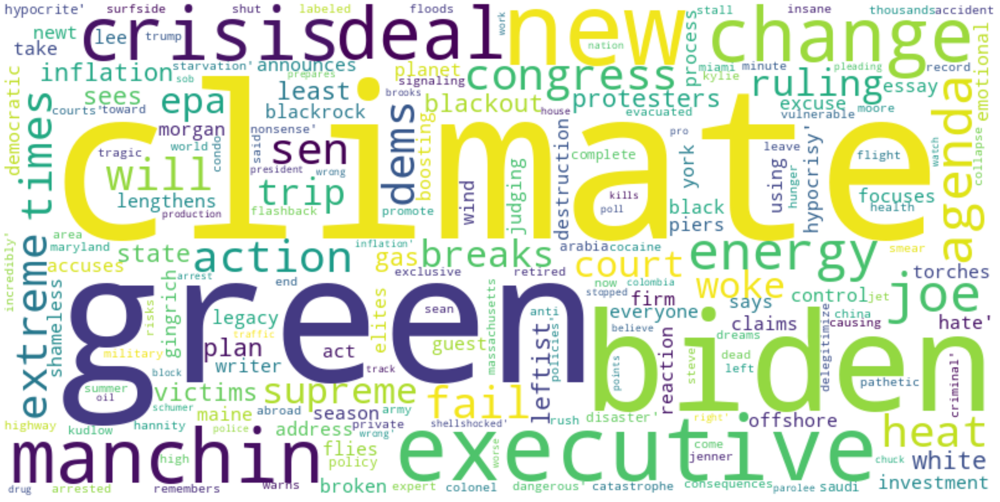

In [49]:
%matplotlib inline

wc = WordCloud(width=800, height=400, background_color="white", min_word_length=3).generate(neg_sentences_A.lower())
plt.figure(figsize=(40,80))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

### Word Cloud: Negative Sentences Corpus Liberal

(-0.5, 799.5, 399.5, -0.5)

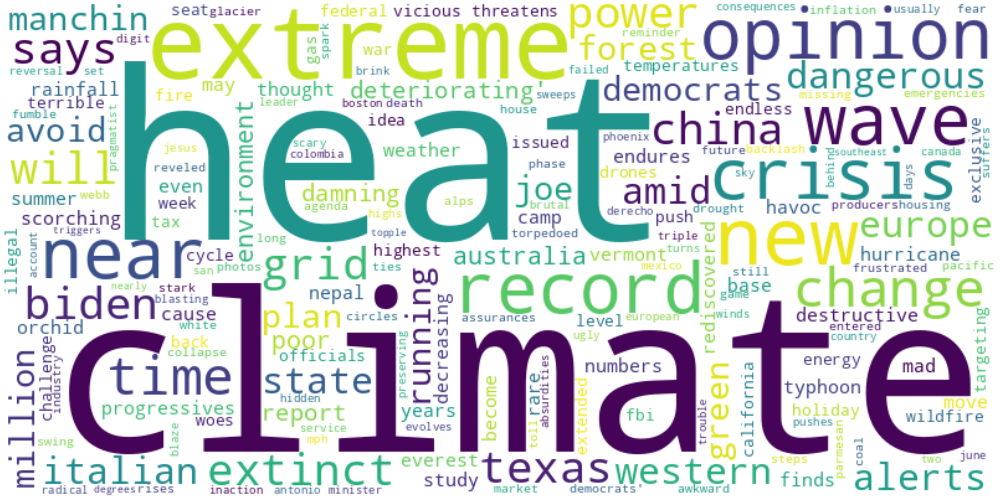

In [50]:
%matplotlib inline

wc = WordCloud(width=800, height=400, background_color="white", min_word_length=3).generate(neg_sentences_B.lower())
plt.figure(figsize=(40,80))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

Based on the two word clouds, it becomes clear that the negative sentences in both corpora refer to different topics. The Corpus Conservative deals primarily with topics related to (domestic) political debates, including Joe Biden’s “Green Deal” as well as other primarily political-economic topics such as “energy”, “inflation” or “crisis”.

The negative sentences in the Corpus Liberal, on the other hand, focus on the effects of the climate crisis, including the increasing heat (“heat,” “record,” “wave”) and its dangers (“extinct,” “destructive,” “alerts,” “dangerous”), but also political aspects play a certain role (“Biden”).

# Conclusion

From a content-related perspective, it can be stated that the three-part analysis (NER, BoW, sentiment) revealed that the articles in the Corpus Conservative primarily discuss U.S. domestic political aspects of climate change, which are particularly related to the effects of climate policy (inflation, energy security, etc.). Since these topics are also frequently mentioned in the negative headlines, with a high frequency of words such as “Democrats” and “Joe Biden”, they show the negative view on climate-related politics in conservative U.S. media.

Even though these topics are definitely also taken up by the articles in Corpus Liberal, concrete (negative) effects of the climate crisis are clearly more present in Corpus Liberal, both in and outside the U.S.

In a next step, these hypotheses should be tested by conducting a qualitative analysis of individual examples in the form of a so-called mixed-methods approach. One first step could be to display a selection of negative titles from both corpora and compare them with each other.

# Qualitative Analysis

In [51]:
import random

In [52]:
# Corpus Conservative
random.shuffle(neg_sentences_A_list)
neg_sentences_A_list[:5]

["Dems 'hate' democratic process judging by reaction to Supreme Court EPA ruling: Sen. Lee",
 "Biden announces executive actions on 'climate crisis,' focuses on extreme heat and boosting offshore wind",
 'Poll: 78% Believe Nation on Wrong Track, Up 27 Points Under Biden',
 "There are consequences to having 'woke nonsense' in our military: Retired Army colonel",
 "Prince Harry Ripped for Trashing United States in U.N. Speech: 'Useful Idiot,' 'Go Home, Little Boy'"]

In [53]:
# Corpus Liberal
random.shuffle(neg_sentences_B_list)
neg_sentences_B_list[:5]

['Hurricane and typhoon numbers are decreasing, study finds, even as they become more destructive',
 'The U.S. plan to avoid extreme climate change is running out of time',
 "Joe Manchin, who just torpedoed Democrats' climate agenda, has long ties to coal industry",
 'Nepal may move Everest Base Camp',
 'Derecho turns sky green, sweeps through 5 states with 90 mph winds']

In sum, I hope to have shown how easy it is to conduct data-driven research with Python. Even though we did not apply any advanced methods (such as clustering algorithms, collocation analysis, etc.), the analysis of a rather small data basis of article headlines gathered via the free tier of the News API already resulted in interesting insights and working hypotheses for a basic research on the debates around “climate change” in U.S. media. Thus, data science with Python does not necessarily demand a PhD in computer science, a large dataset or a sophisticated research question. Sometimes, it can be as interesting and satisfying to examine small bits of data related to everyday topics without having to dedicate the next six months of your life to this task.